# Inference with LLaVa, a multimodal LLM

LLaVa is an exciting new multimodal LLM which extends large language models like [LLaMa](https://huggingface.co/docs/transformers/model_doc/llama) with visual inputs.

For multimodal LLMs, one typically takes a pre-trained/fine-tuned LLM and additionally conditions it on image features. In case of LLaVa, the image features come from a pre-trained [CLIP](https://huggingface.co/docs/transformers/model_doc/clip)'s vision encoder. To match the dimension of the image features with those of the text features, one applies a projection module, which could be a simple linear projection (like the original LLaVa), or more sophisticated like a two-layer MLP (used in LLaVa 1.5).

One then trains the model to predict the next text token, given image features and text tokens.

![image/png](https://cdn-uploads.huggingface.co/production/uploads/62441d1d9fdefb55a0b7d12c/FPshq08TKYD0e-qwPLDVO.png)

* Transformers docs: https://huggingface.co/docs/transformers/main/en/model_doc/llava.
* Original LLaVa paper: https://arxiv.org/abs/2304.08485
* LLaVa 1.5 paper: https://arxiv.org/pdf/2310.03744.pdf
* [notebook](https://colab.research.google.com/drive/1qsl6cd2c8gGtEW1xV5io7S8NHh-Cp1TV?usp=sharing#scrollTo=6Bx8iu9jOssW) which inspired me to create this notebook.

## Set-up environment

Let's start by installing the necessary libraries. Here we install Accelerate and Bitsandbytes in order to load the model in Google Colab. This enables [4-bit inference](https://huggingface.co/blog/4bit-transformers-bitsandbytes) with clever quantization techniques, shrinking the size of the model considerably, while maintaining performance of the original size.

In [43]:
!pip install --upgrade -q accelerate bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.1/315.1 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 MB 16.7 MB/s eta 0:00:00


In [44]:
 !pip install haversine

We also update the Transformers version of Google Colab to use the main branch, as the model is brand new at the time of writing.

In [45]:
!pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-gwvt7cs6
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-gwvt7cs6
  Resolved https://github.com/huggingface/transformers.git to commit 1124d95dbb1a3512d3e80791d73d0f541d1d7e9f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.45.0.dev0-py3-none-any.whl size=9479908 sha256=be888304a246ef81534819c99622682676eeffc9d257655d92ab96b714c4990a
  Stored in directory: /tmp/pip-ephem-wheel-cache-x_vbw55n/wheels/e7/9c/5b/e1a9c8007c343041e61cc484433d512ea9274272e3fcbe7c16
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.42.4
    Uninstalling transformers-4.42.4:
      Successfully uninstalled transformers-4.42.4


## Load model and processor

Next, we load a model and corresponding processor from the hub. We specify device_map="auto" in order to automatically place the model on the available GPUs/CPUs (see [this guide](https://huggingface.co/docs/accelerate/usage_guides/big_modeling) for details).

Regarding [quantization](https://huggingface.co/blog/4bit-transformers-bitsandbytes), refer to the blog post for all details.

In [46]:
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig
import torch

quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)


model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)
model = LlavaForConditionalGeneration.from_pretrained(model_id, quantization_config=quantization_config, device_map="auto")

preprocessor_config.json:   0%|          | 0.00/505 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/41.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/488 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/70.1k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.18G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

In [48]:
import os
import pandas as pd

# 1. Get the Current Directory
current_directory = os.getcwd()
# 2. Construct the Full Path to the CSV File
csv_file_path = os.path.join(current_directory,  'hotel_multimodal.csv')
# Read the CSV file
df_hotels = pd.read_csv(csv_file_path)
geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
# Read the CSV file
geocoded_hotels = pd.read_csv(geocoded_hotels_path)

In [49]:
import requests

def get_current_location():
    try:
        response = requests.get('https://ipinfo.io/json')
        data = response.json()

        location = data.get('loc', '')
        if location:
            latitude, longitude = map(float, location.split(','))
            return latitude, longitude
        else:
            return None, None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None, None

latitude, longitude = get_current_location()
if latitude and longitude:
    print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
else:
    print("Could not retrieve the current location.")


Current location: Latitude = 36.175, Longitude = -115.1372


In [50]:
from geopy.geocoders import Nominatim

def get_coordinates(location_name):
    """Fetches latitude and longitude coordinates for a given location name.

    Args:
        location_name (str): The name of the location (e.g., "Rome, Italy").

    Returns:
        tuple: A tuple containing the latitude and longitude (float values),
               or None if the location is not found.
    """

    geolocator = Nominatim(user_agent="coordinate_finder")
    location = geolocator.geocode(location_name)

    if location:
        return location.latitude, location.longitude
    else:
        return None  # Location not found


In [51]:
import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nerby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels

In [52]:
df_found=find_nerby()

Current location: Latitude = 36.175, Longitude = -115.1372
The 5 closest locations are:

       hotel_id                          hotel_name  chain_id  latitude  \
9811      13630            Downtown Grand Las Vegas        -1  36.17146   
19316     26487          El Cortez Hotel and Casino        -1  36.16868   
19540     26778        Four Queens Hotel and Casino        -1  36.17048   
8573      11950        Golden Nugget Hotel & Casino        -1  36.16996   
11847     16385  Plaza Hotel and Casino - Las Vegas        -1  36.17162   

       longitude       city        country   state        county suburb  \
9811  -115.14209  Las Vegas  United States  Nevada  Clark County    NaN   
19316 -115.13936  Las Vegas  United States  Nevada  Clark County    NaN   
19540 -115.14417  Las Vegas  United States  Nevada  Clark County    NaN   
8573  -115.14461  Las Vegas  United States  Nevada  Clark County    NaN   
11847 -115.14638  Las Vegas  United States  Nevada  Clark County    NaN   

      pos

In [53]:
# Converting df_found[["hotel_id"]].values to a list
hotel_ids = df_found["hotel_id"].values.tolist()

# Extracting rows from df_hotels where hotel_id is in the list hotel_ids
filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]


# Ordering filtered_df by the order of hotel_ids
filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

<ipython-input-53-3c988b8be9b7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)


<ipython-input-54-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-54-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-54-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-54-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]


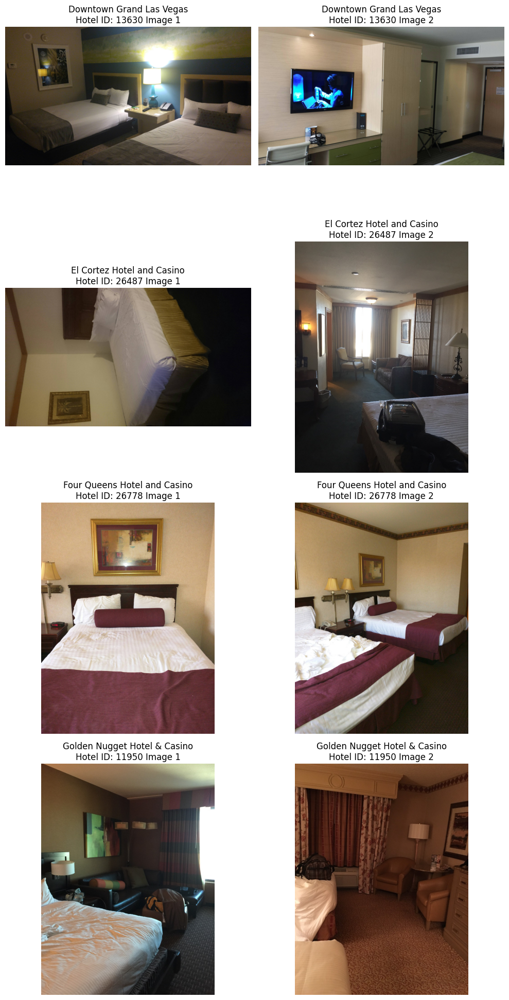

In [54]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Download and display the images
unique_hotel_ids = grouped_df['hotel_id'].unique()

fig, axs = plt.subplots(len(unique_hotel_ids), 2, figsize=(10, 5 * len(unique_hotel_ids)))

for i, hotel_id in enumerate(unique_hotel_ids):
    hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
    hotel_name = hotel_images.iloc[0]['hotel_name']

    for j, image_url in enumerate(hotel_images['image_url']):
        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
            axs[i, j].set_title(f"{hotel_name}\nHotel ID: {hotel_id} Image {j+1}")
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")
            axs[i, j].axis('off')  # Keep the axis off for empty slots

# Handle case when there's only one hotel to avoid index error
if len(unique_hotel_ids) == 1:
    axs = [axs]

plt.tight_layout()
plt.show()


## Prepare image and text for the model

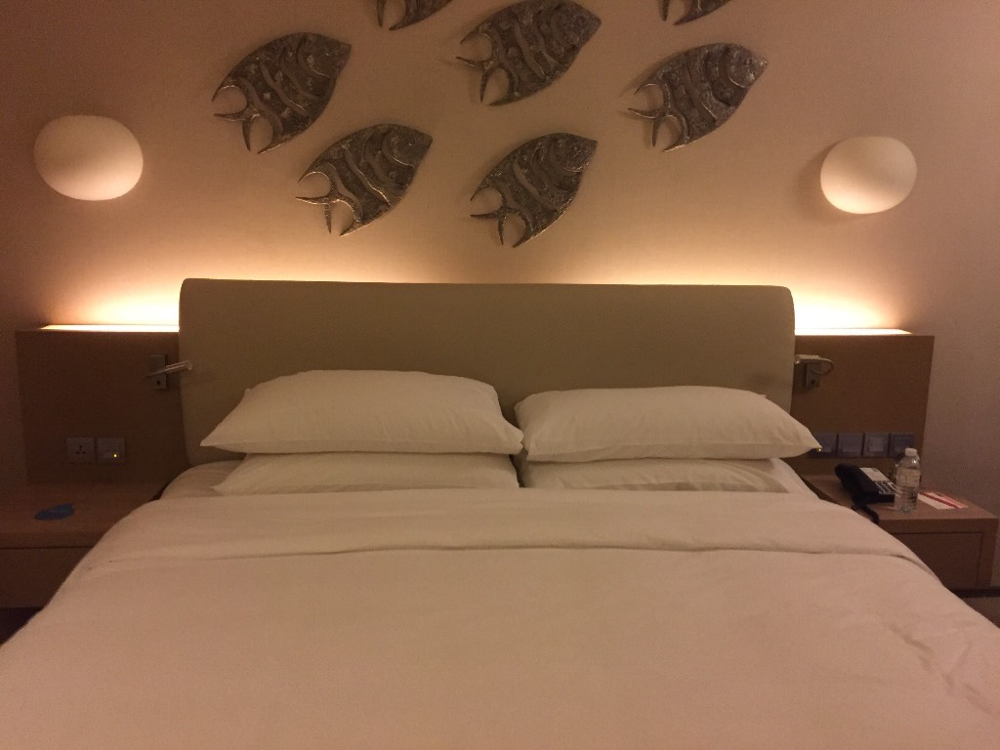

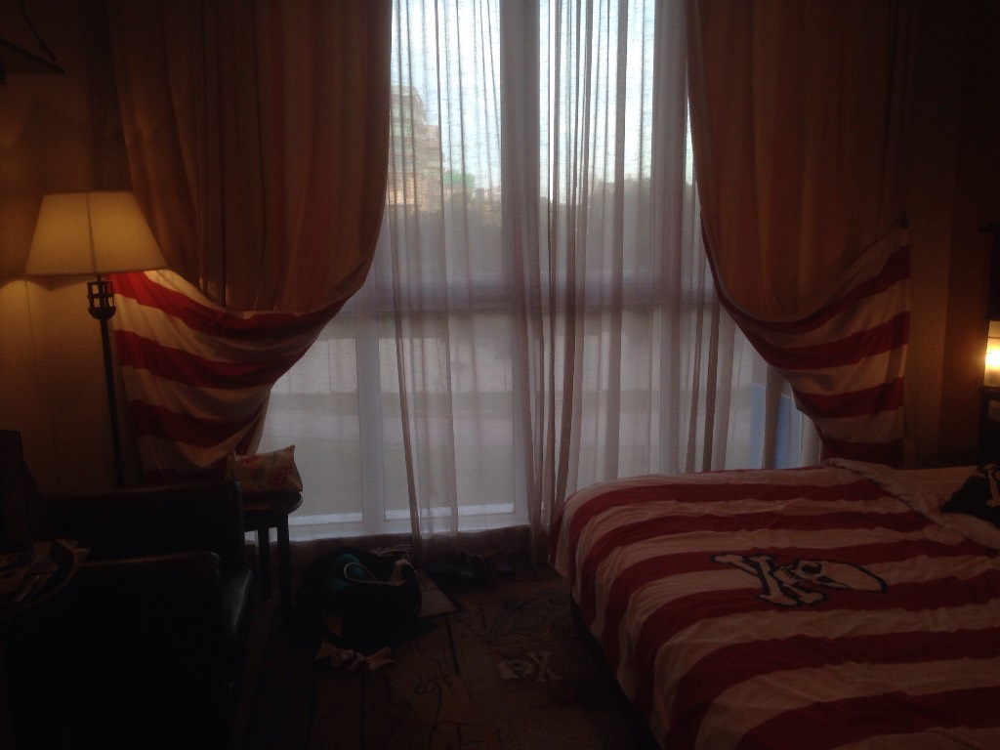

In [55]:
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

def fetch_image(url):
    try:
        response = requests.get(url, stream=True, verify=False)
        response.raise_for_status()  # Check for request errors
        return Image.open(BytesIO(response.content))
    except requests.RequestException as e:
        print(f"Request error: {e}")
        return None
    except UnidentifiedImageError:
        print(f"Unidentified image at URL: {url}")
        return None

image1 = fetch_image("https://traffickcam.com/images/2018/6/20170531_112358_3O8KU1.jpg")
image2 = fetch_image("https://traffickcam.com/images/2018/5/20170404_103446_MO9Q4N.jpg")

if image1:
    display(image1)
if image2:
    display(image2)


In the prompt, you can refer to images using the special \<image> token. To indicate which text comes from a human vs. the model, one uses USER and ASSISTANT respectively. The format looks as follows:

```bash
USER: <image>\n<prompt>\nASSISTANT:
```

In other words, you always need to end your prompt with `ASSISTANT:`. Here we will perform batched generation (i.e generating on several prompts).

In [56]:
prompts = [
    "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:",
    "USER: <image>\nPlease analyze this image and give a detailed description of its contents. Summarize the key features and any noticeable activities or points of interest.\nASSISTANT:",    ]

inputs = processor(prompts, images=[image1, image2], padding=True, return_tensors="pt").to("cuda")
for k, v in inputs.items():
    print(k, v.shape)


input_ids torch.Size([2, 75])
attention_mask torch.Size([2, 75])
pixel_values torch.Size([2, 3, 336, 336])


## Autoregressively generate completion

Finally, we simply let the model predict the next tokens given the images + prompt. Of course one can adjust all the [generation parameters](https://huggingface.co/docs/transformers/v4.35.2/en/main_classes/text_generation#transformers.GenerationMixin.generate). By default, greedy decoding is used.

In [57]:
output = model.generate(**inputs, max_new_tokens=100)
generated_text = processor.batch_decode(output, skip_special_tokens=True)
for text in generated_text:
  print(text.split("ASSISTANT:")[-1])

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


 The image features a large, neatly made bed with white sheets and pillows. The bed is positioned in a room with a wall adorned with fish-shaped decorations, creating a unique and visually appealing atmosphere. The room appears to be well-lit, with a lamp on the wall and a light shining down on the bed.

Based on the image, the room seems to be a comfortable and inviting space. It is worth visiting,
 The image features a cozy bedroom with a large bed occupying most of the space. The bed is adorned with a red and white striped comforter, adding a touch of color to the room. A chair is placed near the bed, and a handbag can be seen on the floor, possibly belonging to the person who sleeps in the room.

A window is present in the room, allowing natural light to enter. The room also has a couch,


## Pipeline API

Alternatively, you can leverage the [pipeline](https://huggingface.co/docs/transformers/main_classes/pipelines) API which abstracts all of the logic above away for the user. We also provide the quantization config to make sure we leverage 4-bit inference.

In [58]:
from transformers import pipeline

pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [59]:
max_new_tokens = 200
prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"

outputs = pipe(image1, prompt=prompt, generate_kwargs={"max_new_tokens": 200})

In [ ]:
print(outputs[0]["generated_text"])

###  Generation of Description of Pictures

In [60]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Define the quantization config and model ID
quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)

model_id = "llava-hf/llava-1.5-7b-hf"

# Initialize the pipeline
pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Create a new DataFrame for storing image descriptions
description_data = []

# Download and generate descriptions for the images
for index, row in grouped_df.iterrows():
    hotel_id = row['hotel_id']
    hotel_name = row['hotel_name']
    image_url = row['image_url']

    try:
        response = requests.get(image_url, verify=False)
        response.raise_for_status()  # Check for request errors
        img = Image.open(BytesIO(response.content))

        # Generate description for the image
        prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
        outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
        description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

        # Append data to the list
        description_data.append({
            'hotel_name': hotel_name,
            'hotel_id': hotel_id,
            'image': img,
            'description': description
        })
    except (requests.RequestException, UnidentifiedImageError):
        print(f"Skipping image at URL: {image_url}")

# Create a DataFrame from the description data
description_df = pd.DataFrame(description_data)



`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [61]:
description_df

,hotel_name,hotel_id,image,description
0,Downtown Grand Las Vegas,13630,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image features a hotel room with two beds,..."
1,Downtown Grand Las Vegas,13630,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a room with a television mo...
2,El Cortez Hotel and Casino,26487,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a bed with a white comforte...
3,El Cortez Hotel and Casino,26487,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a spacious and well-lit livi...
4,Four Queens Hotel and Casino,26778,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a neatly made bed in a hote...
5,Four Queens Hotel and Casino,26778,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a hotel room with two neatl...
6,Golden Nugget Hotel & Casino,11950,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a cozy and well-furnished li...
7,Golden Nugget Hotel & Casino,11950,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a hotel room with a neatly ...


In [62]:
import pandas as pd
def build_context_string(description_df):
    # Group by hotel_id
    grouped = description_df.groupby('hotel_id')

    context_list = []

    # Iterate through each group
    for hotel_id, group in grouped:
        hotel_name = group['hotel_name'].iloc[0]  # Get the hotel name (assuming it's the same for each group)
        descriptions = group['description'].tolist()  # Get all descriptions for this hotel_id

        # Concatenate the descriptions into a single string
        combined_description = " ".join(descriptions)

        # Build the context string for this hotel
        context_string = f"Hotel Name: {hotel_name}\nHotel ID: {hotel_id}\nDescription: {combined_description}\n"
        context_list.append(context_string)

    # Concatenate all context strings into a single context string
    final_context_string = "\n".join(context_list)

    return final_context_string




In [63]:
# Example usage
context_string = build_context_string(description_df)


In [64]:
print(context_string)

Hotel Name: Golden Nugget Hotel & Casino
Hotel ID: 11950
Description: The image depicts a cozy and well-furnished living room. The room features a comfortable bed, a couch, and a chair. There is a painting on the wall, and a clock is visible on the wall as well. A laptop is placed on the couch, and a remote control can be seen nearby.

The room appears to be a hotel room, as there is a suitcase in the room, suggesting that someone is staying there. The room is well-lit, and the overall atmosphere seems inviting and relaxing.

Based on the image, the hotel room seems to be a pleasant and comfortable place to stay. However, it is essential to consider the hotel's reputation, location, and amenities when deciding whether to visit or stay there. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable and hassle- The image features a hotel room with a neatly made bed, a chair, and a couch. The room is well-l

In [65]:
import json

def generate_prompt(context_string, user_request):
    # Create the prompt string
    prompt = f"User request: {user_request}\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\n{context_string}\n"

    return prompt
# Example usage
user_request = "I am looking for a hotel with a great view and close to the city center."



In [66]:
generate_prompt(context_string, user_request)

"User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\nHotel Name: Golden Nugget Hotel & Casino\nHotel ID: 11950\nDescription: The image depicts a cozy and well-furnished living room. The room features a comfortable bed, a couch, and a chair. There is a painting on the wall, and a clock is visible on the wall as well. A laptop is placed on the couch, and a remote control can be seen nearby.\n\nThe room appears to be a hotel room, as there is a suitcase in the room, suggesting that someone is staying there. The room is well-lit, and the overall atmosphere seems inviting and relaxing.\n\nBased on the image, the hotel room seems to be a pleasant and comfortable place to stay. However, it is essential to consider the hotel's reputation, location, and amenities when deciding whether 

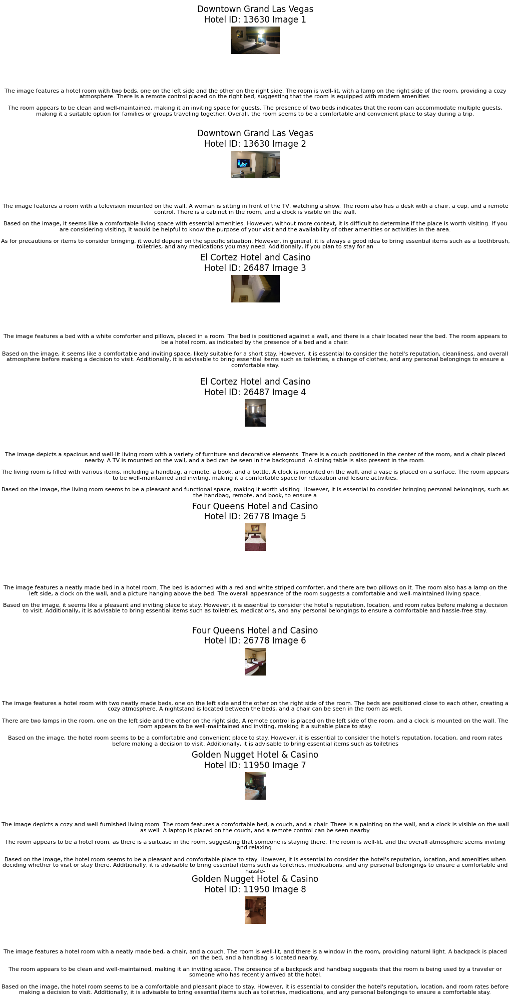

In [67]:
# Plot all pictures in a grid with descriptions
num_hotels = description_df['hotel_id'].nunique()
num_images = len(description_df)
num_rows = num_images * 2  # Each image row will be followed by a description row

fig, axs = plt.subplots(num_rows, 1, figsize=(10, 5 * num_hotels))

for i, (_, row) in enumerate(description_df.iterrows()):
    img = row['image']
    description = row['description']

    # Plot the image
    axs[2*i].imshow(img)
    axs[2*i].axis('off')
    axs[2*i].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {i+1}")

    # Plot the description
    axs[2*i + 1].text(0.5, 0.5, description, ha='center', va='center', wrap=True, fontsize=8)
    axs[2*i + 1].axis('off')

plt.tight_layout()
plt.show()


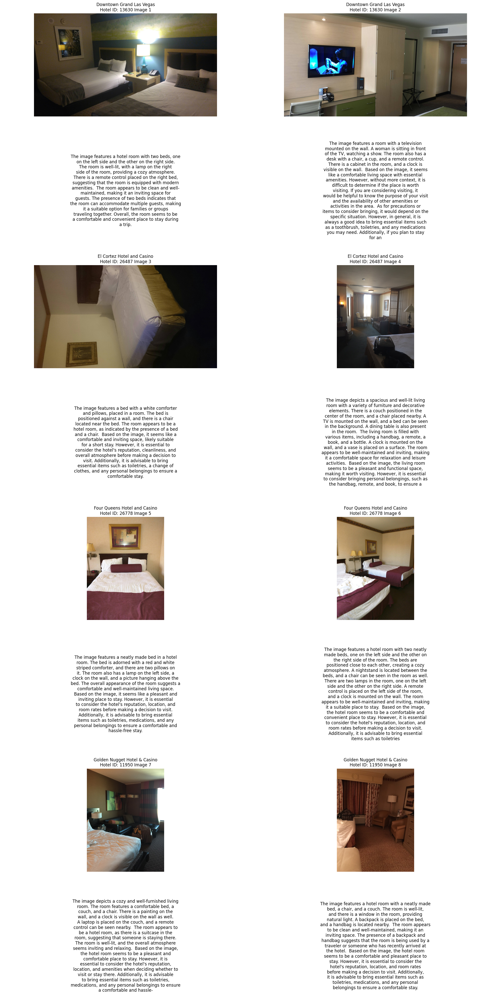

In [68]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}")

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=12)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


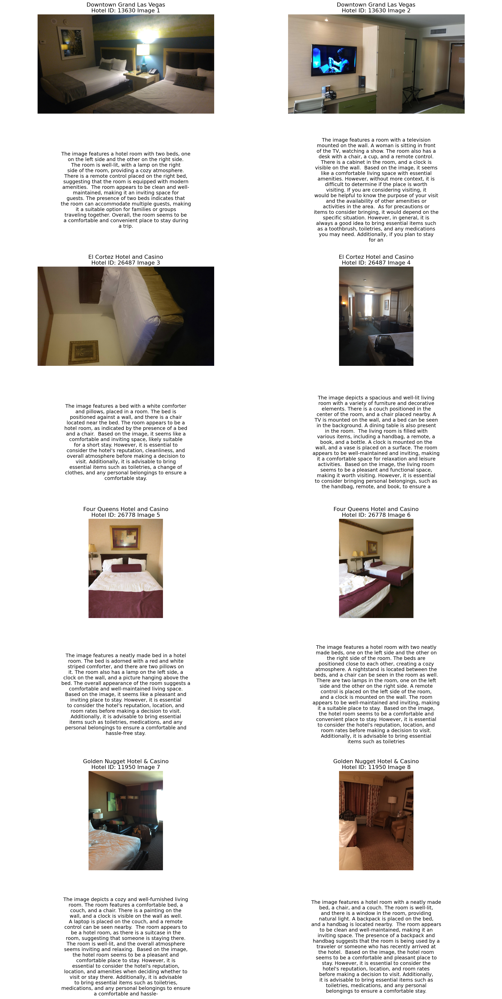

In [69]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


In [70]:

import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nearby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels


In [71]:
def search_hotel(place=None):
    import os
    import pandas as pd
    import requests
    from PIL import Image, UnidentifiedImageError
    from io import BytesIO
    import urllib3
    from transformers import pipeline
    from transformers import BitsAndBytesConfig
    import torch

    # Suppress the InsecureRequestWarning
    urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

    # 1. Get the Current Directory
    current_directory = os.getcwd()
    # 2. Construct the Full Path to the CSV File
    csv_file_path = os.path.join(current_directory, 'hotel_multimodal.csv')
    # Read the CSV file
    df_hotels = pd.read_csv(csv_file_path)
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    # Read the CSV file
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Assuming find_nearby function is defined elsewhere
    df_found = find_nearby(place)

    # Converting df_found[["hotel_id"]].values to a list
    hotel_ids = df_found["hotel_id"].values.tolist()

    # Extracting rows from df_hotels where hotel_id is in the list hotel_ids
    filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]

    # Ordering filtered_df by the order of hotel_ids
    filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
    filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

    # Define the quantization config and model ID
    quantization_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_compute_dtype=torch.float16
    )

    model_id = "llava-hf/llava-1.5-7b-hf"

    # Initialize the pipeline
    pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

    # Group by hotel_id and take the first 2 image URLs for each hotel
    grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

    # Create a new DataFrame for storing image descriptions
    description_data = []

    # Download and generate descriptions for the images
    for index, row in grouped_df.iterrows():
        hotel_id = row['hotel_id']
        hotel_name = row['hotel_name']
        image_url = row['image_url']

        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))

            # Generate description for the image
            prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
            outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
            description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

            # Append data to the list
            description_data.append({
                'hotel_name': hotel_name,
                'hotel_id': hotel_id,
                'image': img,
                'description': description
            })
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")

    # Create a DataFrame from the description data
    description_df = pd.DataFrame(description_data)
    return description_df


In [72]:
import os
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch
import textwrap


def show_hotels(place=None):
    description_df = search_hotel(place)

    # Calculate the number of rows needed
    num_images = len(description_df)
    num_rows = (num_images + 1) // 2  # Two images per row

    fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

    current_index = 0

    for _, row in description_df.iterrows():
        img = row['image']
        description = row['description']

        if img is None:  # Skip if the image is missing
            continue

        row_idx = (current_index // 2) * 2
        col_idx = current_index % 2

        # Plot the image
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('off')
        axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

        # Wrap the description text
        wrapped_description = "\n".join(textwrap.wrap(description, width=50))

        # Plot the description
        axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
        axs[row_idx + 1, col_idx].axis('off')

        current_index += 1

    # Hide any unused subplots
    total_plots = (current_index + 1) // 2 * 2
    for j in range(current_index, total_plots * 2):
        row_idx = (j // 2) * 2
        col_idx = j % 2
        if row_idx < num_rows * 2:
            axs[row_idx, col_idx].axis('off')
        if row_idx + 1 < num_rows * 2:
            axs[row_idx + 1, col_idx].axis('off')

    plt.tight_layout()
    plt.show()


Current location: Latitude = 36.175, Longitude = -115.1372


<ipython-input-71-f1f30b0b9d29>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
`low_cpu_mem_usage` was None, now set to True since model is quantized.


The 5 closest locations are:

       hotel_id                          hotel_name  chain_id  latitude  \
9811      13630            Downtown Grand Las Vegas        -1  36.17146   
19316     26487          El Cortez Hotel and Casino        -1  36.16868   
19540     26778        Four Queens Hotel and Casino        -1  36.17048   
8573      11950        Golden Nugget Hotel & Casino        -1  36.16996   
11847     16385  Plaza Hotel and Casino - Las Vegas        -1  36.17162   

       longitude       city        country   state        county suburb  \
9811  -115.14209  Las Vegas  United States  Nevada  Clark County    NaN   
19316 -115.13936  Las Vegas  United States  Nevada  Clark County    NaN   
19540 -115.14417  Las Vegas  United States  Nevada  Clark County    NaN   
8573  -115.14461  Las Vegas  United States  Nevada  Clark County    NaN   
11847 -115.14638  Las Vegas  United States  Nevada  Clark County    NaN   

      postcode                           road house_number  distance

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

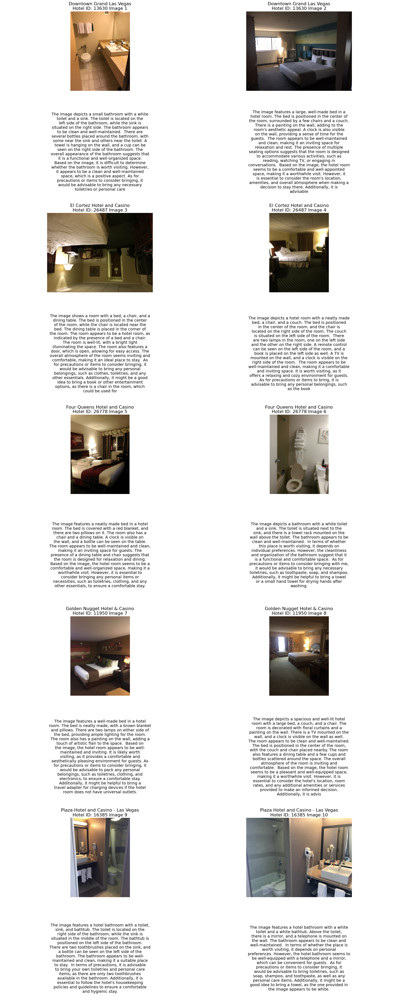

In [73]:
 show_hotels()

# WatsonX Integration with Multimodal

In [77]:
!pip install "langchain" | tail -n 1
!pip install "ibm-watsonx-ai" | tail -n 1
!pip install -U langchain_ibm | tail -n 1
!pip install wget | tail -n 1
!pip install sentence-transformers | tail -n 1
!pip install "chromadb==0.3.26" | tail -n 1
!pip install "pydantic==1.10.0" | tail -n 1
!pip install "sqlalchemy==2.0.1" | tail -n 1
!pip install tiktoken
!pip install "ibm-watsonx-ai>=0.2.6" | tail -n 1

In [79]:
!pip install -U langchain-community

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 5.7 MB/s eta 0:00:00


In [81]:
import json
import os
import getpass
from dotenv import load_dotenv
from langchain.text_splitter import CharacterTextSplitter
from langchain.vectorstores import Chroma
from langchain.document_loaders import TextLoader
from ibm_watsonx_ai.foundation_models.utils import get_embedding_model_specs
from langchain_ibm import WatsonxEmbeddings
from ibm_watsonx_ai.foundation_models.utils.enums import EmbeddingTypes, ModelTypes
from ibm_watsonx_ai.metanames import GenTextParamsMetaNames as GenParams
from ibm_watsonx_ai.foundation_models.utils.enums import DecodingMethods
from langchain_ibm import WatsonxLLM
from langchain.chains import RetrievalQA

In [82]:
# Load environment variables from .env file
load_dotenv()

# Try to get API key from environment, or prompt user for input
apikey = os.getenv("API_KEY")  # Update to the correct variable name in your .env file
if apikey is None:
    apikey = getpass.getpass("Please enter your WML API key: ")  # Secure masked input

# Define credentials dictionary
credentials = {
    "url": "https://us-south.ml.cloud.ibm.com",
    "apikey": apikey
}

# Try to get project_id from environment
project_id = os.getenv("PROJECT_ID")
# If not found, prompt user for input
if project_id is None:
    project_id = input("Please enter your project_id (hit enter to skip): ")



Please enter your WML API key: ··········
Please enter your project_id (hit enter to skip): 67bbb357-f402-46e5-a784-8b5835462094


In [83]:
from langchain.docstore.document import Document

# Create a Document object from the context string
document = Document(page_content=context_string)

# Create a list containing the single Document object
documents = [document]

In [84]:
# Split the context string into chunks
text_splitter = CharacterTextSplitter(chunk_size=512, chunk_overlap=50)
texts = text_splitter.split_documents(documents)

In [85]:
get_embedding_model_specs(credentials.get('url'))

{'total_count': 5,
 'limit': 100,
 'first': {'href': 'https://us-south.ml.cloud.ibm.com/ml/v1/foundation_model_specs?version=2023-09-30&filters=function_embedding'},
 'resources': [{'model_id': 'baai/bge-large-en-v1',
   'label': 'bge-large-en-v1',
   'provider': 'baai',
   'source': 'baai',
   'functions': [{'id': 'embedding'}],
   'short_description': 'An embedding model with version 1.5. It has 335 million parameters and an embedding dimension of 1024.',
   'long_description': 'This model has multi-functionality like dense retrieval, sparse retrieval, multi-vector, Multi-Linguality, and Multi-Granularity(8192 tokens)',
   'input_tier': 'class_c1',
   'output_tier': 'class_c1',
   'number_params': '335m',
   'limits': {'lite': {'call_time': '5m0s'},
    'v2-professional': {'call_time': '10m0s'},
    'v2-standard': {'call_time': '10m0s'}},
   'lifecycle': [{'id': 'available', 'start_date': '2024-05-16'},
    {'id': 'withdrawn', 'start_date': '2024-08-05'}]},
  {'model_id': 'ibm/slate-

In [86]:
embeddings = WatsonxEmbeddings(
    model_id=EmbeddingTypes.IBM_SLATE_30M_ENG.value,
    url=credentials["url"],
    apikey=credentials["apikey"],
    project_id=project_id
)

In [87]:
# Split the context string into chunks
text_splitter = CharacterTextSplitter(chunk_size=512, chunk_overlap=0)
# Pass the Document objects directly to split_documents
texts = text_splitter.split_documents(documents)

docsearch = Chroma.from_texts([t.page_content for t in texts], embeddings) # Extract page_content here

In [88]:
model_id = ModelTypes.GRANITE_13B_CHAT_V2

In [89]:
parameters = {
    GenParams.DECODING_METHOD: DecodingMethods.GREEDY,
    GenParams.MIN_NEW_TOKENS: 1,
    GenParams.MAX_NEW_TOKENS: 500,
    #GenParams.STOP_SEQUENCES: [""]
}

watsonx_granite = WatsonxLLM(
    model_id=model_id.value,
    url=credentials.get("url"),
    apikey=credentials.get("apikey"),
    project_id=project_id,
    params=parameters
)

In [90]:
qa = RetrievalQA.from_chain_type(llm=watsonx_granite, chain_type="stuff", retriever=docsearch.as_retriever())


In [91]:
def generate_prompt(context_string, user_request):
    # Create the prompt string
    prompt = f"User request: {user_request}\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\n{context_string}\n"
    return prompt

In [92]:
def get_top_hotels(user_request):
    relevant_texts = docsearch.similarity_search(user_request, k=5)
    context = " ".join([text.page_content for text in relevant_texts])
    prompt = generate_prompt(context, user_request)
    print(prompt)
    result = qa.invoke(prompt)
    return json.loads(result)

In [93]:
# Example usage
user_request = "I am looking for a hotel with a great view and close to the city center."


In [94]:
def get_top_hotels(user_request):
    relevant_texts = docsearch.similarity_search(user_request, k=5)
    context = " ".join([text.page_content for text in relevant_texts])
    prompt = generate_prompt(context, user_request)
    print(prompt)
    result = qa.invoke(prompt)
    return result

In [95]:
# Get the top hotels based on the user request
top_hotels = get_top_hotels(user_request)

User request: I am looking for a hotel with a great view and close to the city center.

Given the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.

Context:
Hotel Name: Downtown Grand Las Vegas
Hotel ID: 13630
Description: The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable stay. Hotel Name: 

In [96]:
print(top_hotels)

{'query': "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\nHotel Name: Downtown Grand Las Vegas\nHotel ID: 13630\nDescription: The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable 

In [97]:
# Print the results
print(json.dumps(top_hotels, indent=1))


{
 "query": "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\nHotel Name: Downtown Grand Las Vegas\nHotel ID: 13630\nDescription: The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortabl

In [106]:
json_data=top_hotels


In [107]:
json_data

{'query': "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\nHotel Name: Downtown Grand Las Vegas\nHotel ID: 13630\nDescription: The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable 

In [104]:
import json
import re

# Extract the 'result' value
result_string = json_data['result']

# Function to find the balanced JSON object in a string
def find_balanced_json(s):
    stack = []
    json_start = -1

    for i, char in enumerate(s):
        if char == '{':
            if not stack:
                json_start = i
            stack.append(char)
        elif char == '}':
            if stack:
                stack.pop()
                if not stack:
                    return s[json_start:i+1]
    return None

# Use the function to find the JSON object within the result string
result_json_string = find_balanced_json(result_string)

if result_json_string:
    # Parse the JSON string into a dictionary
    result_dict = json.loads(result_json_string)
    print(result_dict)
else:
    print("No JSON object found in the result string.")


{'hotelName': 'Downtown Grand Las Vegas', 'hotelId': 13630, 'description': "The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable stay.", 'view': 'The image does not provide a direct view of the city center, but the hotel is located in the heart of the city, which is a plus.', 'proximityToCityCenter': 'The hotel is located in the heart of the city, which is close to the city center.', 'amenities

In [108]:
result_dict

{'hotelName': 'Downtown Grand Las Vegas',
 'hotelId': 13630,
 'description': "The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities. Based on the image, the hotel room seems to be a comfortable and pleasant place to stay. However, it is essential to consider the hotel's reputation, location, and room rates before making a decision to visit. Additionally, it is advisable to bring essential items such as toiletries, medications, and any personal belongings to ensure a comfortable stay.",
 'view': 'The image does not provide a direct view of the city center, but the hotel is located in the heart of the city, which is a plus.',
 'proximityToCityCenter': 'The hotel is located in the heart of the city, which is close to the city center.',
 'amen

In [112]:
import pandas as pd

def create_dataframe(result_dict):
    # Create a DataFrame using the result_dict
    df = pd.DataFrame([result_dict])

    # Rename columns to match the desired output
    df = df.rename(columns={
        'hotelId': 'hotel_id',
        'description': 'recommendation'
    })

    return df

In [113]:
# Create the DataFrame using the function
dfa = create_dataframe(result_dict)


In [114]:
dfa

,hotelName,hotel_id,recommendation,view,proximityToCityCenter,amenities,priceRange
0,Downtown Grand Las Vegas,13630,"The image features a hotel room with two beds,...",The image does not provide a direct view of th...,"The hotel is located in the heart of the city,...","The hotel offers a variety of amenities, inclu...",The price range for the hotel rooms is $69 - $...


In [116]:
import pandas as pd

# Merge dfa with description_df on 'hotel_id' while preserving the order of 'dfa'
merged_df = dfa[['hotel_id', 'recommendation']].merge(description_df, on='hotel_id', how='left')

# Ensure the final dataframe contains all columns from the original description_df plus the recommendation column
final_df = merged_df[['hotel_name', 'hotel_id', 'image', 'description', 'recommendation']]




In [121]:
final_df.values

array([['Downtown Grand Las Vegas', 13630,
        <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=5312x2988 at 0x7D5425FDDA50>,
        'The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is a remote control placed on the right bed, suggesting that the room is equipped with modern amenities.\n\nThe room appears to be clean and well-maintained, making it an inviting space for guests. The presence of two beds indicates that the room can accommodate multiple guests, making it a suitable option for families or groups traveling together. Overall, the room seems to be a comfortable and convenient place to stay during a trip.',
        "The image features a hotel room with two beds, one on the left side and the other on the right side. The room is well-lit, with a lamp on the right side of the room, providing a cozy atmosphere. There is 

In [118]:
final_df.columns

Index(['hotel_name', 'hotel_id', 'image', 'description', 'recommendation'], dtype='object')

Error loading image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=5312x2988 at 0x7D5425FDDA50>: read
Error loading image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4128x2322 at 0x7D549558A230>: read


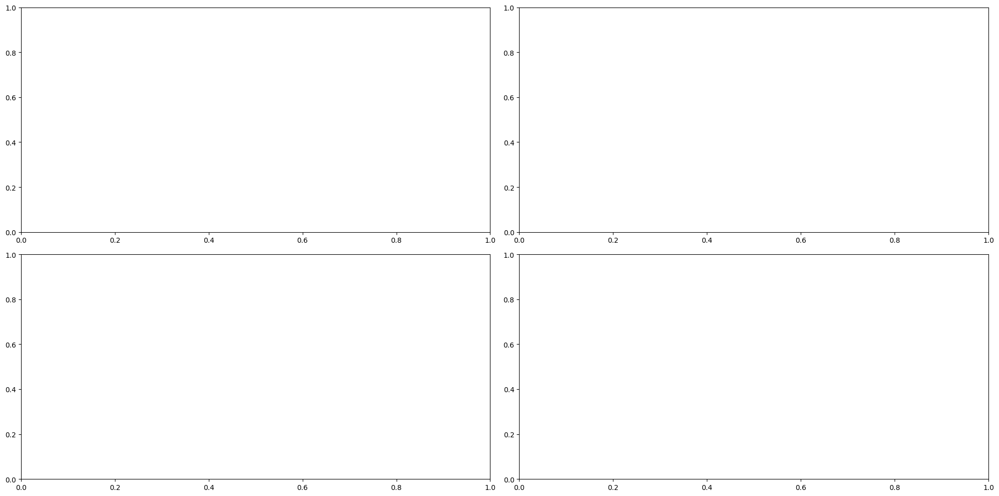

In [120]:
# Function to plot the images and descriptions
def plot_images_and_descriptions(df):
    unique_hotels = df['hotel_id'].unique()
    num_images = len(unique_hotels)
    num_rows = (num_images + 1) // 2  # Two images per row

    fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))
    current_index = 0

    for hotel_id in unique_hotels:
        hotel_data = df[df['hotel_id'] == hotel_id]

        for _, row in hotel_data.iterrows():
            img_path = row['image']
            description = row['description']
            recommendation = row['recommendation']

            try:
                img = Image.open(img_path)
                img = np.array(img)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue

            row_idx = (current_index // 2) * 2
            col_idx = current_index % 2

            # Plot the image
            axs[row_idx, col_idx].imshow(img)
            axs[row_idx, col_idx].axis('off')
            axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} - {recommendation}", fontsize=16)

            # Wrap the description text
            wrapped_description = "\n".join(textwrap.wrap(description, width=50))

            # Plot the description
            axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
            axs[row_idx + 1, col_idx].axis('off')

            current_index += 1

    # Hide any unused subplots
    total_plots = (current_index + 1) // 2 * 2
    for j in range(current_index, total_plots * 2):
        row_idx = (j // 2) * 2
        col_idx = j % 2
        if row_idx < num_rows * 2:
            axs[row_idx, col_idx].axis('off')
        if row_idx + 1 < num_rows * 2:
            axs[row_idx + 1, col_idx].axis('off')

    plt.tight_layout()
    plt.show()

# Call the function to plot the data
plot_images_and_descriptions(final_df)